In [1]:
from tqdm import tqdm
import numpy as np
import pandas as pd
from sklearn.neighbors import LocalOutlierFactor
from sklearn.manifold import TSNE
from umap import UMAP
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
np.random.seed(42)

In [85]:
plt.rcParams.update({'font.size': 30, 'axes.titley':1.01})
c_s = ['g__Bacteroides', 'g__Prevotella', 'g__Ruminococcus']

# Load data

In [44]:
data_pca = {}
for dataset_name in tqdm(['AGP', 'HMP']):
    for tax in ['g']: 
        label = f'{dataset_name}_{tax}'
        data_pca[label] = np.genfromtxt(f'./results/pca/{label}', delimiter=';')
        
        
data_orig = {}
for dataset_name in tqdm(['AGP', 'HMP']):
    for tax in ['g']: 
        dataframe = pd.read_csv(f'./data_processed/{dataset_name}_{tax}.csv', sep=',')
        label = f'{dataset_name}_{tax}'
        data_orig[label] = dataframe.drop('Unnamed: 0', axis=1)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.90it/s]


# UMAP 2D: Visualize

In [45]:
Z_umap = {}
for label, X in tqdm(data_pca.items()):
    Z_umap[label] = UMAP(n_components=2, n_jobs=-1, spread=0.7, random_state=42).fit_transform(X)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [02:05<00:00, 20.95s/it]


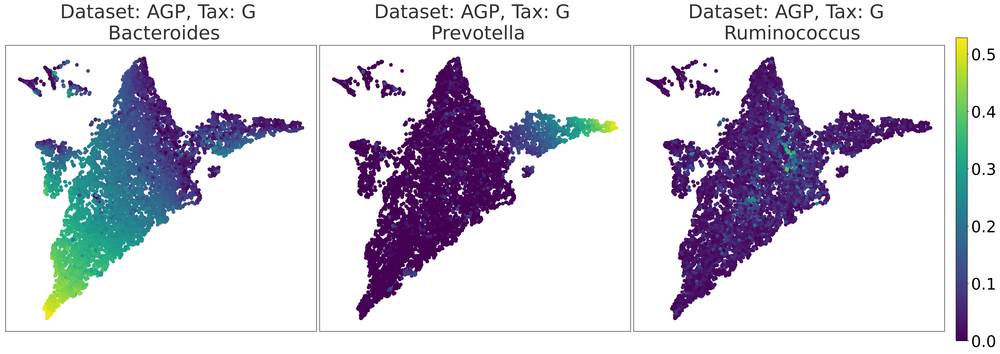

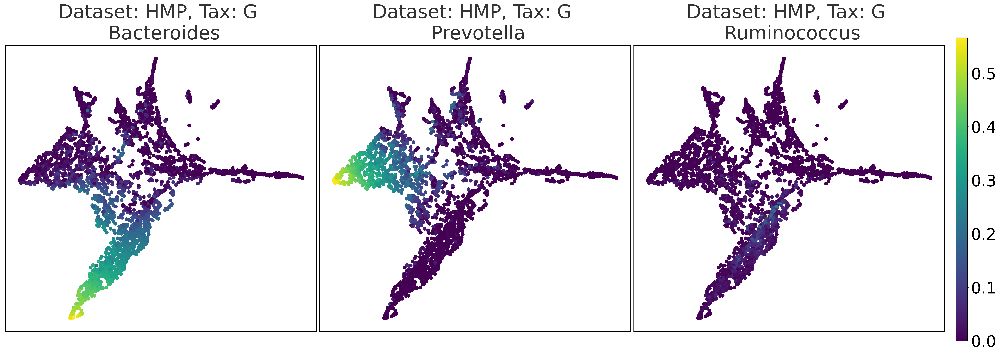

In [95]:
for label, Z in Z_umap.items():
    
    lof_mask = LocalOutlierFactor(n_neighbors=100, contamination=0.1).fit_predict(Z) == 1
    Z = Z[lof_mask]
    
    dataset, tax = label.split('_')
    X_orig = data_orig[dataset + '_' + tax]
    X_orig = X_orig[lof_mask]
        
    fig, axes = plt.subplots(ncols=len(c_s), nrows=1, figsize=(30,10), dpi=400, sharex=True, sharey=True)
    
    for i,c_i in enumerate(c_s):
        mp = axes[i].scatter(Z[:,0], Z[:,1], c=X_orig[c_i])
        c_name = c_i.split('_')[-1]
        axes[i].set_title(f'Dataset: {dataset}, Tax: {tax.capitalize()} \n {c_name}', alpha=0.8)
        axes[i].set_xticks([])
        axes[i].set_yticks([])

    fig.subplots_adjust(right=0.95,
                        wspace=0.01, 
                        hspace=0.01)
    cbar_ax = fig.add_axes([0.96, 0.1, 0.01, 0.8]) # l,b,w,h
    fig.colorbar(mp, cax=cbar_ax)
plt.show()

# t-SNE 2D

In [18]:
Z_tsne = {}
for label, X in tqdm(data_pca.items()):
    Z_tsne[label] = TSNE(n_components=2, early_exaggeration=6, random_state=42).fit_transform(X)

  0%|                                                                                                                                                  | 0/2 [00:00<?, ?it/s]/media/tom/ibulygin/miniconda3/envs/microbiome2/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/media/tom/ibulygin/miniconda3/envs/microbiome2/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
 50%|█████████████████████████████████████████████████████████████████████                                                                     | 1/2 [00:32<00:32, 32.63s/it]/media/tom/ibulygin/miniconda3/envs/microbiome2/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/me

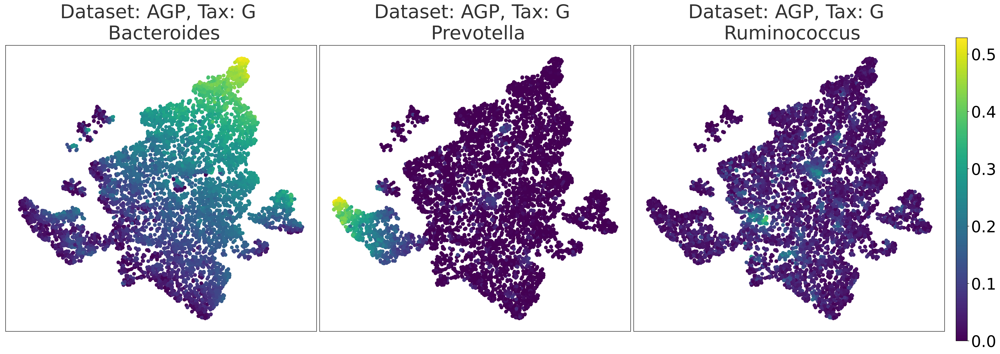

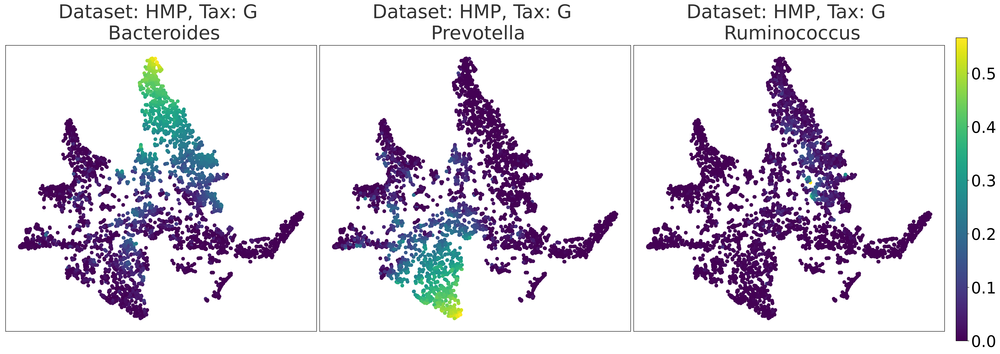

In [94]:
for label, Z in Z_tsne.items():
    
    lof_mask = LocalOutlierFactor(n_neighbors=100, contamination=0.1).fit_predict(Z) == 1
    Z = Z[lof_mask]
    
    dataset, tax = label.split('_')
    X_orig = data_orig[dataset + '_' + tax]
    X_orig = X_orig[lof_mask]
        
    fig, axes = plt.subplots(ncols=len(c_s), nrows=1, figsize=(30,10), dpi=400, sharex=True, sharey=True)
    
    for i,c_i in enumerate(c_s):
        mp = axes[i].scatter(Z[:,0], Z[:,1], c=X_orig[c_i])
        c_name = c_i.split('_')[-1]
        axes[i].set_title(f'Dataset: {dataset}, Tax: {tax.capitalize()} \n {c_name}', alpha=0.8) 
        axes[i].set_xticks([])
        axes[i].set_yticks([])

    fig.subplots_adjust(right=0.95,
                        wspace=0.01, 
                        hspace=0.01)
    cbar_ax = fig.add_axes([0.96, 0.1, 0.01, 0.8]) # l,b,w,h
    fig.colorbar(mp, cax=cbar_ax)

plt.show()